In [1]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import copy
from Data_Sampler_Valentinos import *
from PIL import Image
import torch
import torchvision.transforms as T
import random
from tqdm import tqdm
# from distutils.dir_util import copy_tree
import shutil
from pathlib import Path

In [2]:
# Set the path to the dataset
base_folder = '/mnt/beegfs/vpariz01/workspace/cv2/CVPR2023-3D-Occupancy-Prediction-CV2'
dataset_path = os.path.join(base_folder,'data/occ3d-nus')
data_gen_path = os.path.join(base_folder,'./data_gen/base_dataset_copy')
tables_dir_src = os.path.join(base_folder, '/occ3d-nus/v1.0-trainval')

In [3]:
# Load the annotations file
with open(os.path.join(data_gen_path, 'annotations.json'), 'r') as f:
    annotations = json.load(f)

In [4]:
def select_frames_to_add_noise(scene_names, annotations, noisy_scenes_perc=0.2, noisy_frames_perc=0.2, min_noisy_frms=1, max_noisy_frms=3):
    noisy_scenes = dict()
    total_scenes = len(scene_names)
    # Compute the number of noisy images
    total_noisy_imgs = round(total_scenes * noisy_scenes_perc)
    # Select the Scenes to have noise
    noisy_scenes_mask = np.zeros(total_scenes)
    noisy_scenes_mask[:total_noisy_imgs] = 1
    np.random.shuffle(noisy_scenes_mask)
    for i,sname in enumerate(scene_names):
        if int(noisy_scenes_mask[i]) == 0:
            continue
        noisy_scenes[sname] = dict()
        total_frms = len(annotations['scene_infos'][sname].keys())
        total_noisy_frms = round(total_frms*noisy_frames_perc)
        # Select the frames to have noise
        noisy_frms_mask = np.zeros(total_frms)
        noisy_frms_mask[:total_noisy_frms] = 1
        np.random.shuffle(noisy_frms_mask)
        for j, (frm_token, frm_val) in enumerate(annotations['scene_infos'][sname].items()):
            if int(noisy_frms_mask[j]) == 0:
                continue
            noisy_scenes[sname][frm_token]=set()
            # Decide for which views to have noise
            cam_views = sorted(list(frm_val['camera_sensor'].keys()))
            num_of_noisy_views = random.randint(min_noisy_frms, max_noisy_frms)
            noisy_views_idces = random.sample(range(len(cam_views)), num_of_noisy_views)
            for idx in noisy_views_idces:
                noisy_scenes[sname][frm_token].add(cam_views[idx])
    return noisy_scenes

In [5]:
def sample_square_patches(img_shape, patch_h, patch_w,  max_sampled_patches=1, perc_img_covered=None):
    mask = np.zeros(img_shape)
    h,w = img_shape[:2]
    # for _ in range(num_patches):
    total_pixls = h * w
    def sample_patch(mask, h=h, w=w, patch_h=patch_h, patch_w=patch_w):
        y_idx = np.random.randint(0,h-patch_h+1)
        x_idx = np.random.randint(0,w-patch_w+1)
        mask[y_idx:y_idx+patch_h, x_idx:x_idx+patch_w]=1
        return mask
    count_masked_pixels = lambda x: np.where(x[:,:,0]==1)[0].shape[0]
    if perc_img_covered is not None:
        while perc_img_covered >= count_masked_pixels(mask)/total_pixls:
            sample_patch(mask)
    else:
        for _ in range(max_sampled_patches):
            sample_patch(mask)
    return mask

In [6]:
def mix_images(img_0, img_1, mask):
    return np.where(mask==1, img_1, img_0)

In [7]:
def add_noise_to_image(img, mask, noise_type='black', noise_args={'kernel_size':(5, 9), 'sigma':(0.1, 5)}):
    img_arr = np.asarray(img)
    transf_img_arr = None
    if noise_type == 'black':
        transf_img_arr = np.zeros_like(img_arr)
    elif noise_type=='blurring':
        blurrer = T.GaussianBlur(**noise_args)
        transf_img_arr = np.asarray(blurrer(img))
    else:
        raise "Not supported Image Transformation."        
    noisy_img_arr = mix_images(img_arr, transf_img_arr, mask)
    return Image.fromarray(noisy_img_arr.astype('uint8'), 'RGB'), mask

In [8]:
def generate_noisy_images(scene_names, noisy_scenes, patch_h=20, patch_w=20,  max_sampled_patches=1, perc_img_covered=0.25, save_dir:str='.', noise_type='black', noise_args={}, save_not_noisy_imgs=True):
    for sname in tqdm(scene_names):
        not_noisy_scene = sname not in noisy_scenes
        for frm_token, frm_val in annotations['scene_infos'][sname].items():
            not_noisy_frame = not_noisy_scene or frm_token not in noisy_scenes[sname]
            for cam_view, cam_val in frm_val['camera_sensor'].items():
                not_noisy_cam_view = not_noisy_frame or cam_view not in noisy_scenes[sname][frm_token]
                if not save_not_noisy_imgs and not_noisy_cam_view:
                    continue
                # 1. Load the Image
                img = Image.open(os.path.join(dataset_path, 'samples',cam_val['img_path']))
                save_dest = os.path.join(save_dir,'samples',cam_val['img_path'])
                path = os.path.normpath(save_dest)
                os.makedirs(os.path.join(*path.split(os.sep)[:-1]),exist_ok=True)
                if not not_noisy_cam_view:
                    # 2. Decide where to puth the noise
                    mask = sample_square_patches(np.asarray(img).shape, patch_h=patch_h, patch_w=patch_w,  max_sampled_patches=max_sampled_patches, perc_img_covered=perc_img_covered)
                    # 3. Add the noise
                    img = add_noise_to_image(img, mask=mask,  noise_type=noise_type, noise_args=noise_args)[0]
                # 4. Save the image
                img.save(save_dest)

In [9]:
def copy_dataset(src_data_dir, dest_data_dir, scene_names):
    os.makedirs(dest_data_dir, exist_ok=True)
    to_copy_folders = ['maps','v1.0-trainval']
    for dir in to_copy_folders:
        src_p = os.path.join(src_data_dir, dir)
        dest_p = os.path.join(dest_data_dir, dir)
        shutil.copytree(src_p, dest_p, dirs_exist_ok=True)
    # copy the annotations.json
    src_p = os.path.join(src_data_dir, 'annotations.json')
    dest_p = os.path.join(dest_data_dir, 'annotations.json')
    shutil.copy(src_p, dest_p)

    dir_name = 'gts'
    for scene_dir in os.listdir(os.path.join(src_data_dir, dir_name)):
        if scene_dir in scene_names:
            src_p = os.path.join(src_data_dir, dir_name, scene_dir)
            dest_p = os.path.join(dest_data_dir, dir_name, scene_dir)
            shutil.copytree(src_p, dest_p, dirs_exist_ok=True)

In [10]:
def generate_bundle_of_noisy_imgs(annotations, train_scenes, val_scenes, bundle_noise_confs:dict, noise_selection_confs:dict, save_dir:str, dataset_path=None):
    noisy_train_scenes = select_frames_to_add_noise(train_scenes, annotations, **noise_selection_confs)
    noisy_val_scenes= select_frames_to_add_noise(val_scenes, annotations, **noise_selection_confs)
    noisy_scenes = {**noisy_train_scenes, **noisy_val_scenes}
    scene_names = set(train_scenes).union(set(val_scenes))
    for bundle_id, noise_confs in bundle_noise_confs.items():
        if dataset_path is not None:
            copy_dataset(dataset_path, dest_data_dir=save_dir, scene_names=scene_names)
        generate_noisy_images(scene_names, noisy_scenes, **noise_confs, save_dir=os.path.join(save_dir, bundle_id))

In [11]:
noise_selection_confs = {
    'noisy_scenes_perc':0.25,
    'noisy_frames_perc': 0.25,
    'min_noisy_frms': 1,
    'max_noisy_frms': 3
}

In [12]:
bundle_noise_confs = dict()

def get_desc(d, nscnf):
        nscnf_str = "data-perc-{}_img-perc{}_nsfrms-({},{})".format(nscnf["noisy_scenes_perc"], nscnf["noisy_frames_perc"], nscnf["min_noisy_frms"], nscnf["max_noisy_frms"])
        d_str = '{}_{}x{}_cov-{}'.format(d['noise_type'], d['patch_h'],d['patch_w'],d['perc_img_covered'])
        return "{}-{}".format(nscnf_str, d_str)


noise_config= {
    'patch_h': 120, 
    'patch_w': 120,  
    'max_sampled_patches': None, 
    'perc_img_covered': 0.15, 
    'noise_type': 'blurring', 
    'noise_args': {'kernel_size':(21, 21), 'sigma':(6, 6)}
}
bundle_noise_confs[get_desc(noise_config, noise_selection_confs)] = noise_config


In [13]:
train_scenes = set(annotations['train_split'])
val_scenes = set(annotations['val_split'])
scene_names = train_scenes.union(val_scenes)
save_dir='./temp2'
# generate_bundle_of_noisy_imgs(annotations, train_scenes, val_scenes, bundle_noise_confs=bundle_noise_confs, noise_selection_confs=noise_selection_confs, save_dir=save_dir)

In [14]:
# copy_dataset(dataset_path, dest_data_dir=save_dir, scene_names=set(train_scenes).union(set(val_scenes)))

In [15]:
scenes_names = set(train_scenes).union(set(val_scenes))
for sname in scene_names:
    for frm_token, frm_val in annotations['scene_infos'][sname].items():
        for cam_view, cam_val in frm_val['camera_sensor'].items():
            if 'n008-2018-08-28-16-57-39-0400__CAM_BACK__1535489985937575' in cam_val['img_path']:
                orig_img = Image.open(os.path.join(dataset_path, 'samples',cam_val['img_path']))
                break

In [43]:
# data_noise_cases = list(range(1,4))
data_noise_cases = [1]
gen_noise_cases = list(range(1,11))

imgs = dict()

for data_noise_case in data_noise_cases:
    for gen_noise_case in gen_noise_cases:
        print(gen_noise_case)
        gen_noise_case = [gen_noise_case]
        noise_selection_confs = {
            'noisy_scenes_perc':0.25,
            'noisy_frames_perc': 0.25,
            'min_noisy_frms': 1,
            'max_noisy_frms': 3
        }
        if data_noise_case == 2 :
            noise_selection_confs = {
                'noisy_scenes_perc':0.50,
                'noisy_frames_perc': 0.50,
                'min_noisy_frms': 1,
                'max_noisy_frms': 3
            }
        if data_noise_case == 3 :
            noise_selection_confs = {
                'noisy_scenes_perc':0.75,
                'noisy_frames_perc': 0.75,
                'min_noisy_frms': 1,
                'max_noisy_frms': 3
            }
        bundle_noise_confs = dict()
        def get_desc(d, nscnf):
            nscnf_str = "{}, {}, ({},{})".format(nscnf["noisy_scenes_perc"], nscnf["noisy_frames_perc"], nscnf["min_noisy_frms"], nscnf["max_noisy_frms"])
            d_str = '{}_{}x{}, {}'.format(d['noise_type'], d['patch_h'],d['patch_w'],d['perc_img_covered'])
            return d_str #"{}-{}".format(nscnf_str, d_str)

        if 1 in gen_noise_case :
            noise_config= {
                'patch_h': 25, 
                'patch_w': 25,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.10, 
                'noise_type': 'black', 
                'noise_args': {}
            }
            bundle_noise_confs[get_desc(noise_config, noise_selection_confs)] = noise_config
        if 2 in gen_noise_case :
            noise_config= {
                'patch_h': 25, 
                'patch_w': 25,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.20, 
                'noise_type': 'black', 
                'noise_args': {}
            }
            bundle_noise_confs[get_desc(noise_config, noise_selection_confs)] = noise_config
        if 3 in gen_noise_case :
            noise_config= {
                'patch_h': 25, 
                'patch_w': 25,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.30, 
                'noise_type': 'black', 
                'noise_args': {}
            }
            bundle_noise_confs[get_desc(noise_config, noise_selection_confs)] = noise_config
        if 4 in gen_noise_case :
            noise_config= {
                'patch_h': 120, 
                'patch_w': 120,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.15, 
                'noise_type': 'blurring', 
                'noise_args': {'kernel_size':(21, 21), 'sigma':(6, 6)}
            }
            bundle_noise_confs[get_desc(noise_config, noise_selection_confs)] = noise_config
        if 5 in gen_noise_case :
            noise_config= {
                'patch_h': 120, 
                'patch_w': 120,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.30, 
                'noise_type': 'blurring', 
                'noise_args': {'kernel_size':(25, 25), 'sigma':(8, 8)}
            }
            bundle_noise_confs[get_desc(noise_config, noise_selection_confs)] = noise_config
        if 6 in gen_noise_case :
            noise_config= {
                'patch_h': 120, 
                'patch_w': 120,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.50, 
                'noise_type': 'blurring', 
                'noise_args': {'kernel_size':(25, 25), 'sigma':(8, 8)}
            }
            bundle_noise_confs[get_desc(noise_config, noise_selection_confs)] = noise_config
        if 7 in gen_noise_case :
            noise_config= {
                'patch_h': 120, 
                'patch_w': 120,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.75, 
                'noise_type': 'blurring', 
                'noise_args': {'kernel_size':(25, 25), 'sigma':(8, 8)}
            }
        if 8 in gen_noise_case :
            noise_config= {
                'patch_h': 120, 
                'patch_w': 120,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.30, 
                'noise_type': 'blurring', 
                'noise_args': {'kernel_size':(51, 51), 'sigma':(20, 20)}
            }

        if 9 in gen_noise_case :
            noise_config= {
                'patch_h': 120, 
                'patch_w': 120,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.50, 
                'noise_type': 'blurring', 
                'noise_args': {'kernel_size':(51, 51), 'sigma':(20, 20)}
            }
        if 10 in gen_noise_case :
            noise_config= {
                'patch_h': 120, 
                'patch_w': 120,  
                'max_sampled_patches': None, 
                'perc_img_covered': 0.75, 
                'noise_type': 'blurring', 
                'noise_args': {'kernel_size':(51, 51), 'sigma':(20, 20)}
            }
        if gen_noise_case[0] >= 8:
            desc = "{}*".format(get_desc(noise_config, noise_selection_confs))
        else:
            desc = get_desc(noise_config, noise_selection_confs)
        mask = sample_square_patches(np.asarray(orig_img).shape, patch_h=noise_config['patch_h'], patch_w=noise_config['patch_w'],  max_sampled_patches=noise_config['max_sampled_patches'], perc_img_covered=noise_config['perc_img_covered'])
        noisy_img = add_noise_to_image(orig_img, mask=mask,  noise_type=noise_config['noise_type'], noise_args=noise_config['noise_args'])
        imgs[desc] = noisy_img[0]
        noisy_img[0].save(os.path.join('./temp','{}.png'.format(desc)))

1
2
3
4
5
6
7
8
9
10


In [52]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [42]:
def image_grid_2(imgs, rows, cols, figsize, dpi):
    fig, axarr = plt.subplots(rows,cols, figsize=figsize,dpi=dpi)
    fig.subplots_adjust(wspace = 0)
    descs = list(imgs.keys())
    imgs_list = [imgs[desc] for desc in descs]
    i = 0
    for r in range(rows):
        for c in range(cols):
            if i >= len(descs):
                
                # axarr[r,c].imshow(np.asarray(Image.open('./temp/wet_front_camera_image.png')))
                # # axarr[r,c].axis('off')
                # axarr[r,c].set_xticks([])
                # axarr[r,c].set_yticks([])
                # axarr[r,c].set_xlabel('Image showing wet front camera', fontsize=80)
                axarr[r,c].axis('off')
                continue
            axarr[r,c].imshow(np.asarray(imgs_list[i]))
            # axarr[r,c].axis('off')
            axarr[r,c].set_xticks([])
            axarr[r,c].set_yticks([])
            axarr[r,c].set_xlabel(descs[i], fontsize=80)
            i+=1
    plt.savefig('./temp/noisy_dataset_v3.0.pdf')
    # plt.show()

In [ ]:
image_grid(list(imgs.values()), rows=6, cols=3)

In [41]:
print(len(imgs.keys()))
print(imgs.keys())

imgs2 = dict()
for k,v in imgs.items():
    if 'blurring' in k:
        imgs2["{}*".format(k)] = v
    else:
        imgs2[k] = v
# imgs = imgs2
print(len(imgs.keys()))
print(imgs.keys())

7
dict_keys(['blurring_120x120, 0.15*', 'blurring_120x120, 0.3*', 'blurring_120x120, 0.5*', 'blurring_120x120, 0.75*', 'blurring_120x120, 0.3**', 'blurring_120x120, 0.5**', 'blurring_120x120, 0.75**'])


In [ ]:
image_grid_2(imgs, rows=3, cols=3, figsize=(130, 80),dpi=100)

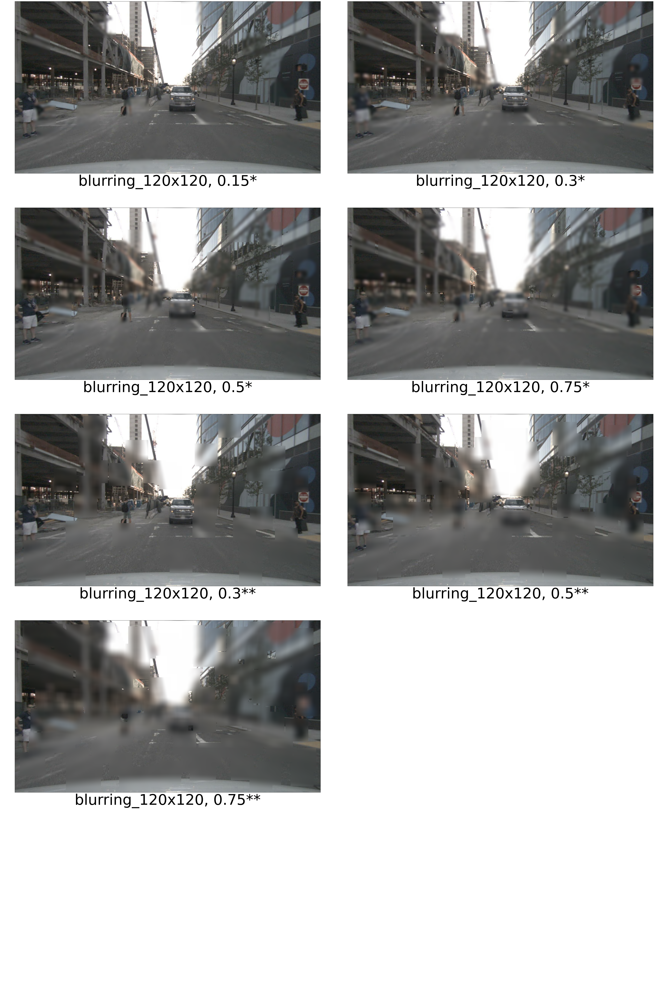

In [39]:
image_grid_2(imgs, rows=5, cols=2, figsize=(65, 100),dpi=100)

In [ ]:
image_grid_2(imgs, rows=7, cols=3, figsize=(100, 140),dpi=80)

In [24]:
bundle_noise_confs = dict()

noise_selection_confs = {
    'noisy_scenes_perc':0.25,
    'noisy_frames_perc': 0.25,
    'min_noisy_frms': 1,
    'max_noisy_frms': 3
}

def get_desc(d, nscnf):
        nscnf_str = "data-perc-{}_img-perc{}_nsfrms-({},{})".format(nscnf["noisy_scenes_perc"], nscnf["noisy_frames_perc"], nscnf["min_noisy_frms"], nscnf["max_noisy_frms"])
        d_str = '{}_{}x{}_cov-{}'.format(d['noise_type'], d['patch_h'],d['patch_w'],d['perc_img_covered'])
        return "{}-{}".format(nscnf_str, d_str)


noise_config= {
    'patch_h': 120, 
    'patch_w': 120,  
    'max_sampled_patches': None, 
    'perc_img_covered': 0.15, 
    'noise_type': 'blurring', 
    'noise_args': {'kernel_size':(21, 21), 'sigma':(6, 6)}
}
bundle_noise_confs[get_desc(noise_config, noise_selection_confs)] = noise_config


In [29]:
mask = sample_square_patches(np.asarray(orig_img).shape, patch_h=120, patch_w=120,  max_sampled_patches=1, perc_img_covered=0.75)
noisy_img = add_noise_to_image(orig_img, mask=mask,  noise_type='blurring', noise_args={'kernel_size':(51, 51), 'sigma':(20, 20)})

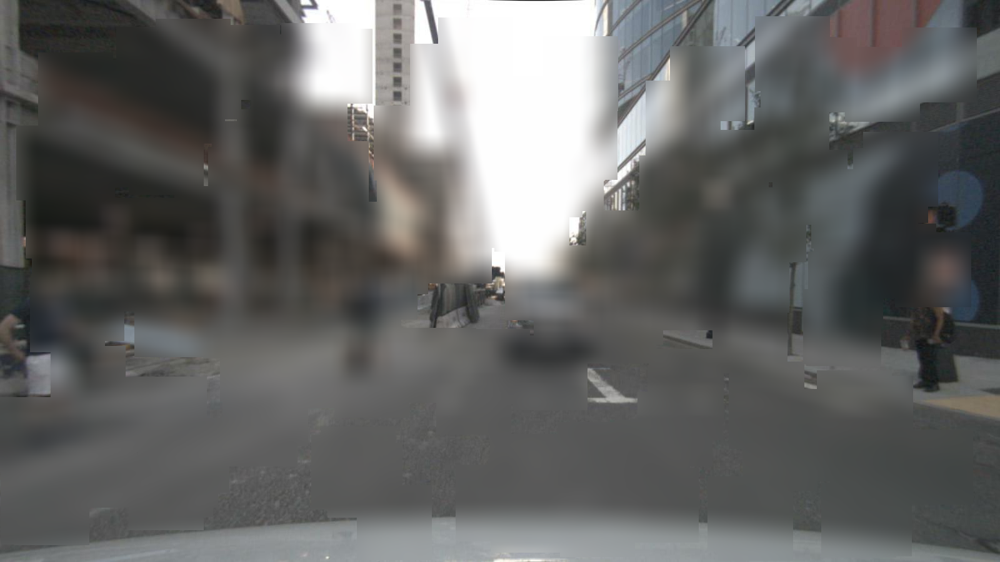

In [30]:
noisy_img[0]